# <span style="color:green"> Numerical Simulation Laboratory (NSL) </span>
## <span style="color:blue">  Numerical exercises 5</span> - <span style="color:red"> Only for master students</span>


In quantum physics a **wave function**, $\Psi$, is a mathematical description of the state of a quantum system. The wave function is a complex-valued probability amplitude, and the probabilities for the possible results of measurements made on the system can be derived from it.

For now on, let's consider the simple case of a non-relativistic single particle, without spin, in three spatial dimensions. The state of such a particle is completely described by its wave function, $\Psi(\vec{r},t)$, where $\vec{r}$ is position and $t$ is time.

For one spinless particle, if the wave function is interpreted as a probability amplitude, the square modulus of the wave function, $|\Psi(\vec{r},t)|^2$, is interpreted as the probability density that the particle is at $\vec{r}$ at time $t$. Once we have a probability density, we can use Monte Carlo ...

### Hydrogen atom
The wave functions of the eigenstates of an electron in a Hydrogen atom (this is the only atom for which the Schroedinger equation has been solved exactly) are expressed in terms of spherical harmonics and generalized Laguerre polynomials. It is convenient to use spherical coordinates, and the wave function can be separated into functions of each coordinate:

$$
\Psi_{n,l,m}(r,\theta,\phi)=
\sqrt{\left(\frac{2}{na_0}\right)^3 \frac{(n-l-1)!}{2n[(n+l)!]}}
e^{-r/na_0}\left(\frac{2r}{na_0}\right)^l L_{n-l-1}^{2l+1}\left(\frac{2r}{na_0}\right)
Y_l^m(\theta,\phi)
$$

where $a_0=4\pi\epsilon_0\hbar^2/m_e e^2=0.0529$ nm is the Bohr radius, $L_{n-l-1}^{2l+1}$ are the generalized Laguerre polynomials of degree $n-l-1$, $n=1,2,...$ is the principal quantum number, $l=0,1, ..., n-1$ the azimuthal quantum number, $m=-l, -l+1, ..., l-1, l$ the magnetic quantum number.

For example, the ground state wave function is:
$$
\Psi_{1,0,0}(r,\theta,\phi)=
\frac{a_0^{-3/2}}{\sqrt{\pi}} e^{-r/a_0} 
$$
whereas one of the three $2p$ excited state is:
$$
\Psi_{2,1,0}(r,\theta,\phi)=
\frac{a_0^{-5/2}}{8}\sqrt{\frac{2}{\pi}} r e^{-r/2a_0} \cos(\theta)
$$
<span style="color:blue">Expectation values for the radius turns out to be exactly:
$$
\left\langle r \right\rangle_{\Psi_{1,0,0}} = \frac{3}{2}a_0
\quad
\left\langle r \right\rangle_{\Psi_{2,1,0}} = 5 a_0
$$
</span>


### Exercise 05.1


Use the Metropolis algorithm to sample $|\Psi_{1,0,0}(x,y,z)|^2$ and $|\Psi_{2,1,0}(x,y,z)|^2$ **in Cartesian coordinates** using, initially, an uniform transition probability $T(\vec{x}|\vec{y})$. Use the sampled positions to estimate $\left\langle r \right\rangle_{\Psi_{1,0,0}}$ and $\left\langle r \right\rangle_{\Psi_{2,1,0}}$. As usual, use data blocking and give an estimate of the statistical uncertainties.

<span style="color:red">Show a picture of your estimations of $\left\langle r \right\rangle_{\Psi_{1,0,0}}$ and $\left\langle r \right\rangle_{\Psi_{2,1,0}}$</span> and their uncertainties with a large number of *throws* $M$ (e.g. $M\ge 10^6$) as a function of the number of blocks, $N$</font>.

- Use Bohr radius units, $a_0$ for distances
- Choose the step of the uniform transition probability $T(\vec{x}|\vec{y})$ in order to obtain 50% of acceptance in both cases
- Choose a reasonable starting point in the 3D space and equilibrate your sampling before to start measuring the radius. What do you observe when you start very far from the origin?
- How large should be the number of Monte Carlo Metropolis steps in each block?
- <span style="color:red">If you use a multivariate normal transition probability $T(\vec{x}|\vec{y})$, i.e. a Gaussian for each coordinate, your results for $\left\langle r \right\rangle_{\Psi_{1,0,0}}$ and $\left\langle r \right\rangle_{\Psi_{2,1,0}}$ are equivalent?</span>

Due to Metropolis we can ignore normalization, in fact the wanted sampled distribution appears in its acceptance term, where it is in a ratio with itself, so normalization terms can be simplified. Also using natural unit and posing as natural measure of distance Bohr radius the sampled state can be again simplified as follows for ground state:

$$
\left|\Psi_{1,0,0}(r,\theta,\phi)\right| ^ 2=e^{-2r} 
$$

And for the first excited state:

$$
\left|\Psi_{2,1,0}(r,\theta,\phi)\right| ^ 2=
r^2 e^{-r} \cos^2(\theta)
$$

In cartesian choordinates $ r = \sqrt{ x^2 + y^2 + z^2 } $ that can be substituted easily, while:
$$
\cos(\theta) = \frac{z}{\sqrt{x^2 + y^2 + z^2}}
$$

So the second expression becames:

$$
\begin{aligned}
\left|\Psi_ {2,1,0}(x,y,z)\right|^2 &=
 \left(x^2 + y^2 + z^2\right) e^{-\sqrt{ x^2 + y^2 + z^2 }}\left( \frac{z}{\sqrt{x^2 + y^2 + z^2}}\right) ^ 2 \\
&=
 z^2 e^{-\sqrt{ x^2 + y^2 + z^2 }}
\end{aligned}
$$

You can use a Python code similar to the following one to observe how the sampled points distribute into the 3D space:

In [46]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d.axes3d import Axes3D
from seaborn import set_theme
set_theme(style='whitegrid')

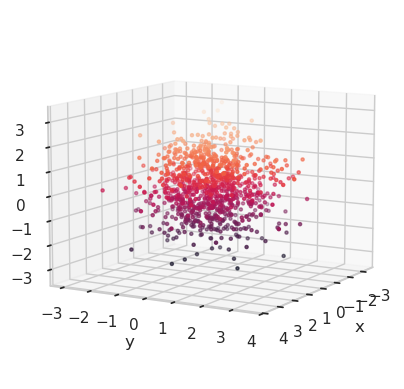

In [34]:
M = 1000
X = np.random.normal(0.0, 1.0, M)
Y = np.random.normal(0.0, 1.0, M)
Z = np.random.normal(0.0, 1.0, M)

fig = plt.figure()
ax: Axes3D = fig.add_subplot(projection="3d")
ax.scatter(X, Y, Z, c=Z, marker=".")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.view_init(10, 30)

## Preparation before computation


In [ ]:
import json
import os
import subprocess
from dataclasses import asdict, dataclass
from enum import Enum
from pathlib import Path
from shutil import copyfile
from typing import Tuple

compilation_command = "make -C eser_5/5_1 all -j".split()
process_return_code = subprocess.run(compilation_command)


program_dir = Path("eser_5/5_1")
output_dir = program_dir / "output"
output_dir.mkdir(parents=True, exist_ok=True)

if process_return_code.returncode == 0:
    print("Compilation successful")
else:
    raise RuntimeError("Compilation failed")


def run_system():
    or_dir = Path.cwd()
    os.chdir(Path("eser_5/5_1"))
    command = "./main_5_1.exe".split()
    result = subprocess.run(command)
    os.chdir(or_dir)
    return result.returncode


# BLOCK_STEPS             1
# PARTICLE_STEPS          1
# THERMALIZATION_STEPS    50
# DELTA                   1.1 # (1.1 orbitale s),(2.5 orbitale p), (5.0 orbitale d)
# FIRST_ROW_INITIALIZER   0
# SECOND_ROW_INITIALIZER  1
# STARTING_POSITION       0.     0.      0.
# OUTPUT_FILE             1
# OUTPUT_VIDEO            0
# INFO_FILE               0
# MEAN_RADIUS_FILE        1
# RESET                   0
# WAVE_FUNCTION           GROUND_STATE
# GENERATOR               UNIFORM


"""Enum class for wave functions types"""


class WaveFunction(Enum):
    GROUND_STATE = "GROUND_STATE"
    FIRST_STATE = "FIRST_EXCITED"
    SECOND_EXCITED = "SECOND_EXCITED"


"""Enum Class for random number generators"""
class Generator(Enum):
    UNIFORM = "UNIFORM"
    NORMAL = "NORMAL"


deltas = {
    WaveFunction.GROUND_STATE: {Generator.UNIFORM: 1.1, Generator.NORMAL: 1.1},
    WaveFunction.FIRST_STATE: {Generator.UNIFORM: 2.5, Generator.NORMAL: 2.5},
    WaveFunction.SECOND_EXCITED: {Generator.UNIFORM: 5.0, Generator.NORMAL: 5.0},
}

wave_function_name = {
    WaveFunction.GROUND_STATE: "1s",
    WaveFunction.FIRST_STATE: "2p",
    WaveFunction.SECOND_EXCITED: "3d",
}


@dataclass
class Config:
    """Class to use to generate config file for the program"""

    blocks: int = 20000
    block_steps: int = 1
    particle_steps: int = 1
    thermalization_steps: int = 100
    delta: float = 1.1
    first_row_initializer: int = 0
    second_row_initializer: int = 1
    starting_position: tuple[float] = (0.0, 0.0, 0.0)
    output_file: bool = True
    output_video: bool = False
    info_file: bool = False
    mean_radius_file: bool = False
    reset: bool = False
    wave_function: str = WaveFunction.GROUND_STATE.value
    generator: str = Generator.UNIFORM.value


conf = Config()
print(json.dumps(asdict(conf), indent=4))


make: Entering directory '/home/pilo/SimulazioneNumerica/eser_5/5_1'
clang++-19 -o main_5_1.exe -I../../src -I../../external_include -g -Wall -Wextra -Werror -O3 -std=c++17 -DUSE_PARALLEL  -stdlib=libc++ -fexperimental-library main_5_1.cpp ./obj/random.o ./obj/utilities.o ./obj/vector3D.o ./obj/wave_function.o ./obj/options.o 
make: Leaving directory '/home/pilo/SimulazioneNumerica/eser_5/5_1'
Compilation successful
{
    "blocks": 20000,
    "block_steps": 1,
    "particle_steps": 1,
    "thermalization_steps": 100,
    "delta": 1.1,
    "first_row_initializer": 0,
    "second_row_initializer": 1,
    "starting_position": [
        0.0,
        0.0,
        0.0
    ],
    "output_file": true,
    "output_video": false,
    "info_file": false,
    "mean_radius_file": false,
    "reset": false,
    "wave_function": "GROUND_STATE",
    "generator": "UNIFORM"
}


## Autocorrelation
Before doing the simulations is necessary to characterize the process in term of autocorrelation, in this way we can extimate correctly the variance in the simulation.

In [49]:
conf.thermalization_steps = 200 # To eliminate errors due to sampling

conf.blocks = 1000
conf.block_steps = 1
conf.particle_steps = 1
conf.info_file = True

for wave in WaveFunction:
    for gen in Generator:
        conf.wave_function = wave.value
        conf.generator = gen.value
        conf.delta = deltas[wave][gen]
        with open("eser_5/5_1/config.jsonc", "w") as f:
            json.dump(asdict(conf), f, ensure_ascii=False, indent=4)
        res = run_system()
        if res != 0:
            raise ValueError()
        result_dir = output_dir / "autocorrelation" / wave.value / gen.value
        result_dir.mkdir(parents=True, exist_ok=True)
        if conf.output_file:
            copyfile(program_dir / "output.csv", result_dir / "output.csv")
        if conf.info_file:
            copyfile(program_dir / "info.txt", result_dir / "info.txt")
        if conf.mean_radius_file:
            copyfile(program_dir / "mean_radius.csv", result_dir / "mean_radius.csv")



Wave Function analyzed is : GROUND_STATE
Generator used is : UNIFORM
Nr Blocks : 1000
Nr Block Steps : 1
Nr Particle Step : 1
Nr Thermalization Steps : 200
   1.15566   1.17495         1	 0.0192899
   1.33746   1.36359         2	 0.0130675
   1.43334   1.45792         3	0.00819317
   1.56579   1.59715         4	0.00784193
   1.46645   1.50073         5	0.00685544
   1.36454   1.40493         6	0.00673157
   1.46122   1.50814         7	0.00670282
   1.74378   1.88533         8	 0.0176938
   2.00339   2.21182         9	 0.0231586
   2.22919   2.47894        10	 0.0249751
   2.60249    2.9903        11	 0.0352554
   2.94093     3.423        12	 0.0401723
   3.24748   3.79388        13	 0.0420307
   3.52545   4.11531        14	  0.042133
   3.68328   4.26219        15	 0.0385944
   4.01827   4.67975        16	 0.0413428
   4.32911   5.05228        17	 0.0425389
   4.61706   5.38559        18	 0.0426962
   4.82258    5.5952        19	 0.0406643
   5.09945   5.91255        20	 0.0406551
   5

To grasp how long a block should be for an orbital, autocorrelation will be calculated  and then it will be fitted with an exponential with this expression:
$$
    f(t) = a \exp\left(-\frac{t}{\tau}\right)
$$


In [37]:
def exponential(t, tau, a):
    return a * np.exp(-t / tau)

In [38]:
def prepare_data(name: Path):
    df = pd.read_csv(
        name,
        names=["instant_x", "instant_y", "instant_z"],
    )
    df["instant_r"] = df.iloc[:, :3].pow(2, axis=1).sum(axis=1).pow(0.5)
    return df


# autocorrelation_data = prepare_data("eser_5/5_1/output/FIRST_EXCITED/NORMAL/output.csv")
# autocorrelation_data.head()

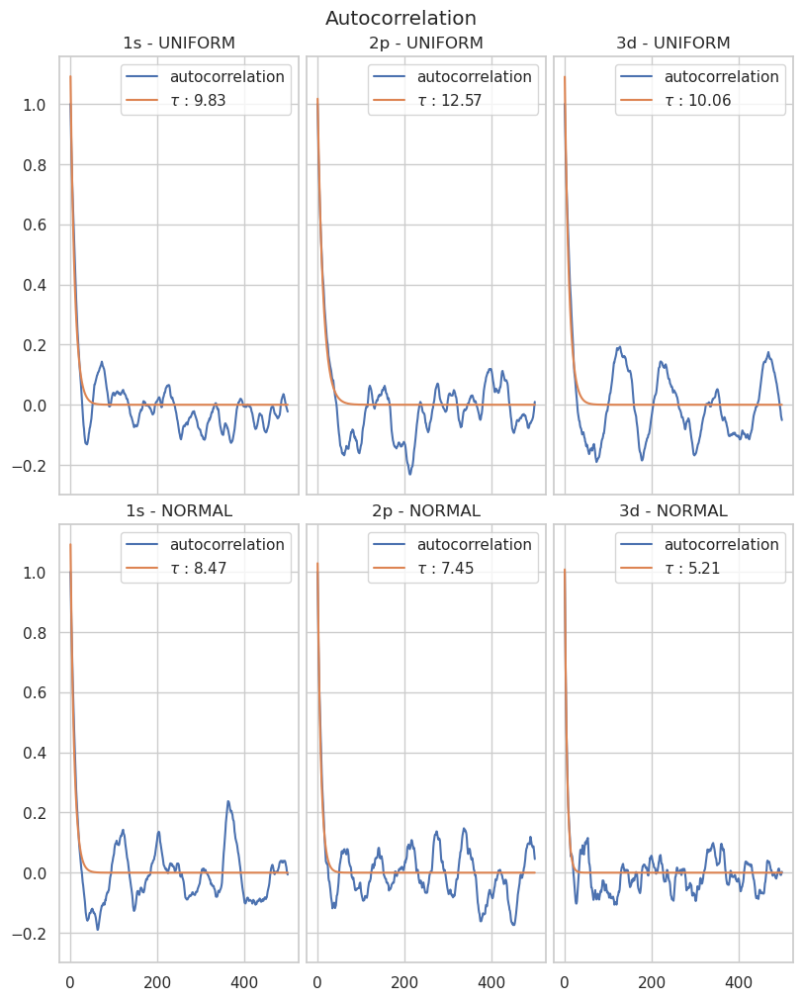

In [ ]:
import scipy
import scipy.optimize
import scipy.signal


# Saving correlation results in a dict to be used later.
correlation_results = {}
fig, axs = plt.subplots(2, 3, figsize=(8, 10), sharex=True, sharey=True, layout='constrained')
fig.suptitle("Autocorrelation")


for col, wave in enumerate(WaveFunction):
    for row, gen in enumerate(Generator):
        acceptance_dir = output_dir / "autocorrelation" / wave.value / gen.value
        acceptance_data = prepare_data(acceptance_dir / "output.csv")
        mean_unif = acceptance_data["instant_r"].values.mean()
        values = acceptance_data["instant_r"].values

        v_autocorrelation = scipy.signal.correlate(
            values - mean_unif,
            values - mean_unif,
            mode="same",
        )

        v_autocorrelation /= v_autocorrelation.max()

        axs[row, col].plot(
            v_autocorrelation[v_autocorrelation.size // 2 : v_autocorrelation.size // 2 + 500],
            label="autocorrelation",
            # marker=".",
            # linestyle="none",
        )

        popt, pcov = scipy.optimize.curve_fit(
            exponential,
            np.arange(
                v_autocorrelation[
                    v_autocorrelation.size // 2 : v_autocorrelation.size // 2 + 500
                ].size
            ),
            v_autocorrelation[v_autocorrelation.size // 2 : v_autocorrelation.size // 2 + 500],
        )

        correlation_results[wave, gen] = popt

        axs[row, col].plot(
            exponential(
                np.arange(
                    v_autocorrelation[
                        v_autocorrelation.size // 2 : v_autocorrelation.size // 2 + 500
                    ].size
                ),
                *popt,
            ),
            label=r"$\tau$ : "+ f"{popt[0]:.2f}",
        )
        axs[row, col].set_title(f"{wave_function_name[wave]} - {gen.value}")

        axs[row, col].legend()

To obtain a good results the block size used was $5\tau$.


## Acceptance

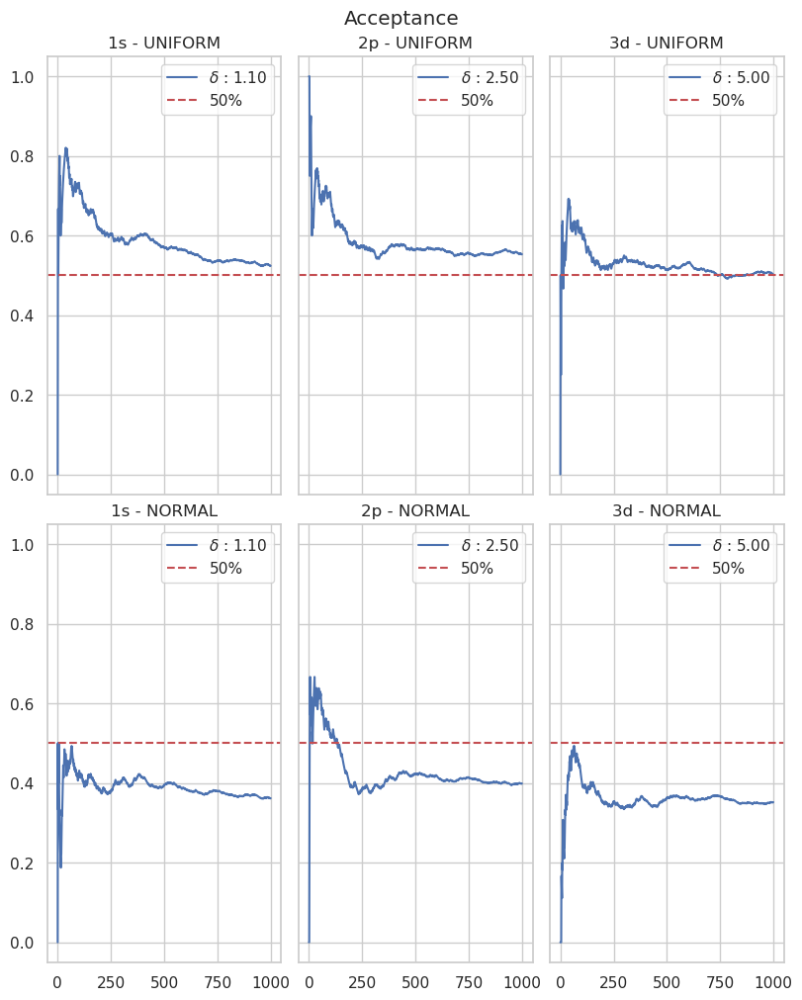

In [59]:
# Saving correlation results in a dict to be used later.
correlation_results = {}
fig, axs = plt.subplots(2, 3, figsize=(8, 10), sharex=True, sharey=True, layout='constrained')
fig.suptitle("Acceptance")


for col, wave in enumerate(WaveFunction):
    for row, gen in enumerate(Generator):
        acceptance_dir = output_dir / "autocorrelation" / wave.value / gen.value
        acceptance_data = pd.read_csv(acceptance_dir / "info.txt")

        acceptance_data['Real_Acceptance'] = acceptance_data['Acceptance'].cumsum() / (acceptance_data['Block'] + 1)
 
        axs[row, col].plot(
            'Block', 'Real_Acceptance',
            data = acceptance_data,
            label=r"$\delta$ : " + f"{deltas[wave][gen]:.2f}",
            # marker=".",
            # linestyle="none",
        )

        axs[row, col].axhline(0.5, color='r', linestyle='--', label='50%')

        axs[row, col].set_title(f"{wave_function_name[wave]} - {gen.value}")

        axs[row, col].legend()

These are the final acceptance ratios obtained using trial and error technique to achieve a 50 % chance for acceptance. Using Normal generator for sampling there was not a significant variation in acceptance ratio.

## Thermalization steps

Metropolis Sampling produces asymptotically the desired distribution, so the first points sampled depends heavily on the starting position. We can extimate from a graph how many points need to be discarded before using the sampler.

To obtain the autocorrelation we started from the origin, then the starting point will be moved away of 5 unit on X-axis for each step.


In [40]:
x_pos_v = np.arange(0, 40 , 10)

y_pos = 0
z_pos = 0

conf.thermalization_steps = 0
conf.block_steps = 1
conf.blocks = 500
conf.info_file= False

for wave in WaveFunction:
    for gen in Generator:
        for x_pos in x_pos_v: 
            conf.generator = gen.value
            conf.wave_function = wave.value
            conf.delta = deltas[wave][gen]
            conf.starting_position = (int(x_pos), 0.0, 0.0)
            with open("eser_5/5_1/config.jsonc", "w") as f:
               json.dump(asdict(conf), f, ensure_ascii=False, indent=4)
            res = run_system()
            if res != 0:
                raise ValueError()
            result_dir = output_dir / f"pos_{x_pos}_{y_pos}_{z_pos}" / wave.value / gen.value
            result_dir.mkdir(parents=True, exist_ok=True)
            if conf.output_file:
                copyfile(program_dir / "output.csv", result_dir / "output.csv")
            if conf.info_file:
                copyfile(program_dir / "info.txt", result_dir / "info.txt")
            if conf.mean_radius_file:
                copyfile(program_dir / "mean_radius.csv", result_dir / "mean_radius.csv")



Wave Function analyzed is : GROUND_STATE
Generator used is : UNIFORM
Nr Blocks : 500
Nr Block Steps : 1
Nr Particle Step : 1
Nr Thermalization Steps : 0
  0.174139  0.348278         1	  0.174139
  0.240049  0.366697         2	 0.0633241
  0.431749  0.610532         3	 0.0595941
  0.573585  0.756832         4	  0.045812
  0.679314  0.854366         5	 0.0350104
  0.760308  0.924033         6	 0.0272876
  0.988181   1.23583         7	 0.0353782
   1.18604   1.47834         8	 0.0365375
   1.35731   1.67234         9	 0.0350035
   1.58129   1.95317        10	 0.0371879
   1.78101    2.1872        11	 0.0369264
   1.95927   2.38522        12	 0.0354959
   2.01984   2.42136        13	  0.030886
   2.21247   2.64862        14	 0.0311539
   2.38822   2.84748        15	 0.0306178
   2.56734   3.05141        16	  0.030254
     2.732   3.23267        17	 0.0294512
   2.74037    3.2148        18	 0.0263574
   2.60878   3.09025        19	 0.0253405
   2.54873   3.01426        20	 0.0232767
   2.49

Text(0.5, 0.98, 'Influence of starting position on sampling')

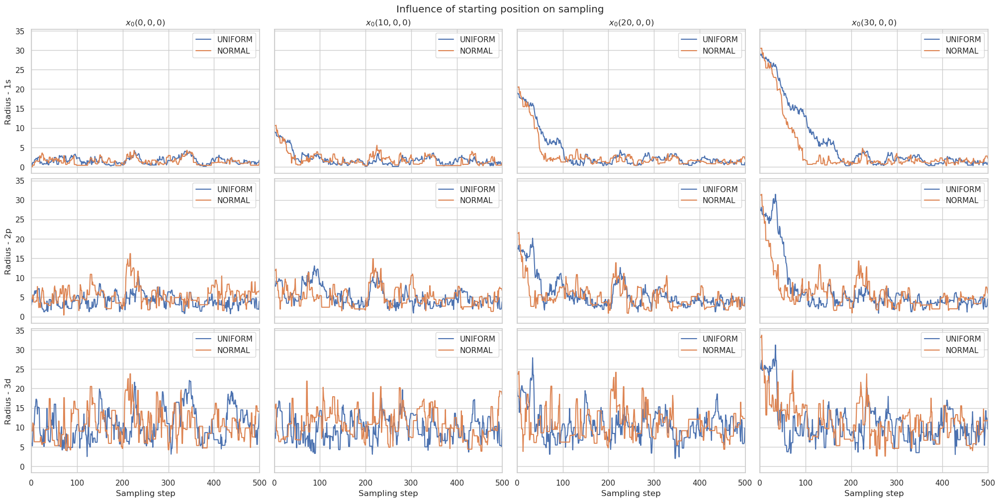

In [ ]:
end_dir_to_plot = [f"pos_{x_pos}_{y_pos}_{z_pos}" for x_pos in x_pos_v]

fig, axs = plt.subplots(
    3, len(x_pos_v), sharey=True, sharex=True, figsize=(20, 10), layout="constrained"
)

for row, wave in enumerate(WaveFunction):
    for col, (end_dir, x_pos) in enumerate(zip(end_dir_to_plot, x_pos_v)):
        for idx, gen in enumerate(Generator):
            acceptance_dir = output_dir / end_dir / wave.value / gen.value
            acceptance_data = prepare_data(acceptance_dir / "output.csv")

            axs[row, col].plot(
                acceptance_data["instant_r"],
                label=f"{gen.value}",
            )
            if row == 0:
                axs[row, col].set_title(f"$x_0 ({x_pos}, {y_pos}, {z_pos})$")
            if col == 0:
                axs[row, col].set_ylabel(f"Radius - {wave_function_name[wave]}")
            if row == 2:
                axs[row, col].set_xlabel("Sampling step")
                axs[row, col].set_xlim(0, acceptance_data.shape[0])

            axs[row, col].legend()
fig.suptitle("Influence of starting position on sampling")

As expected in the case of `1s` orbital there is the highest sensitivity on the starting position, while `3d`orbital is not influenced until we are relatively far from origin.
Also with `2p` and `3d` orbital we can see that the system explores more points in a larger landspace. This is due to the higher energy involved.

Even thought for our purposes is best to start from the origin where the probability is the highest, even said that 200 steps will be used for thermalization.

## Results

In [42]:
# Genearating Results

conf.thermalization_steps = 200

for wave in WaveFunction:
    for gen in Generator:
        conf.wave_function = wave.value
        conf.generator = gen.value
        conf.block_steps = int(np.ceil(5 * correlation_results[wave, gen][0]))
        conf.blocks = 1e6 // conf.block_steps
        conf.delta = deltas[wave][gen]
        with open("eser_5/5_1/config.jsonc", "w") as f:
            json.dump(asdict(conf), f, ensure_ascii=False, indent=4)
        res = run_system()
        if res != 0:
            raise ValueError()
        result_dir = output_dir / "result" / wave.value / gen.value
        result_dir.mkdir(parents=True, exist_ok=True)
        if conf.output_file:
            copyfile(program_dir / "output.csv", result_dir / "output.csv")
        if conf.info_file:
            copyfile(program_dir / "info.txt", result_dir / "info.txt")
        if conf.mean_radius_file:
            copyfile(program_dir / "mean_radius.csv", result_dir / "mean_radius.csv")


Wave Function analyzed is : GROUND_STATE
Generator used is : UNIFORM
Nr Blocks : 20000
Nr Block Steps : 50
Nr Particle Step : 1
Nr Thermalization Steps : 200
   4.19517   4.44813         1	  0.252963
    4.6824    4.8778         2	 0.0977014
    3.4472   3.87691         3	  0.143236
   3.36947   3.71501         4	 0.0863848
   2.84431   3.24342         5	 0.0798215
   2.87781   3.22049         6	 0.0571135
   3.43151   3.90176         7	 0.0671785
   3.13579   3.60708         8	 0.0589118
   2.87702   3.35132         9	    0.0527
   2.83149   3.26449        10	 0.0432998
   2.65472   3.08297        11	 0.0389318
   2.48375   2.91319        12	 0.0357874
   2.32608   2.75846        13	 0.0332598
   2.24966   2.66214        14	 0.0294634
   2.34686   2.74899        15	 0.0268084
   2.56934    3.0284        16	 0.0286913
   2.52066   2.95817        17	 0.0257362
   2.42803   2.85812        18	 0.0238941
   2.42257   2.83121        19	 0.0215078
   2.36961   2.76465        20	 0.0197521
  

In [43]:
result_dir = output_dir / "result" 

### Orbital Shape
The following image shows the sampled points starting from origin using 20000 blocks.

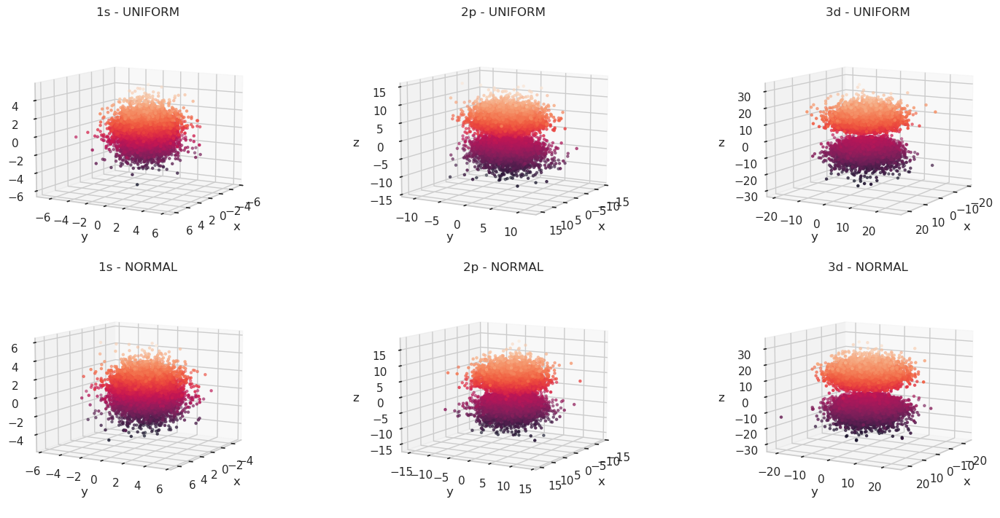

In [47]:
fig = plt.figure(layout = 'constrained', figsize=(15,7))

for col, wave in enumerate(WaveFunction):
    for row, gen in enumerate(Generator):
        result_dir = output_dir / "result" / wave.value / gen.value
        data = np.loadtxt(result_dir / "output.csv", delimiter=",")
        ax : Axes3D = fig.add_subplot(2, 3, col + row * 3 +1, projection="3d")
        ax.scatter(
            data[:, 0],
            data[:, 1],
            data[:, 2],
            c=data[:, 2],
            marker=".",
        )
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        ax.set_zlabel("z")
        ax.view_init(10, 30)
        ax.set_title(f"{wave_function_name[wave]} - {gen.value}")


### MEAN DISTANCE


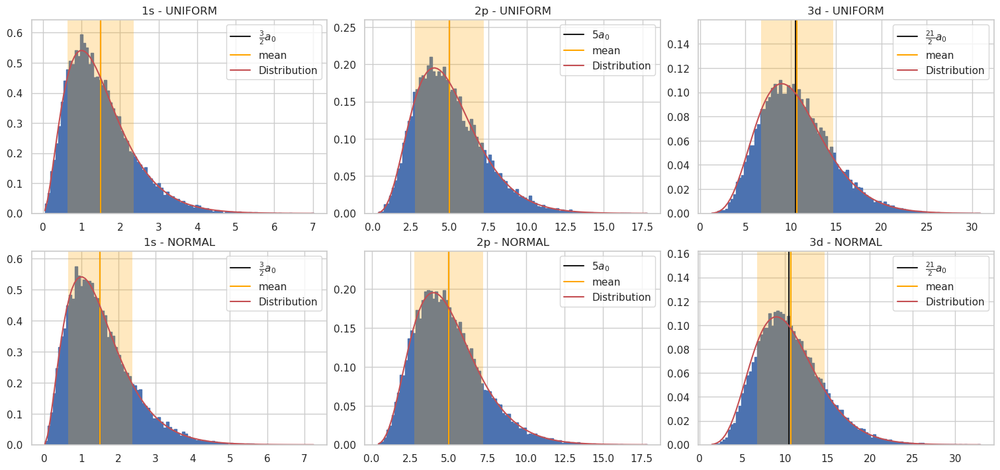

In [45]:
fig, axs = plt.subplots(2, 3, layout="constrained", figsize=(15, 7))


def ground_state_radius(r):
    return 4 * np.exp(-2 * r) * r**2


def first_state_radius(r):
    return 1 / 24 * np.exp(-r) * r**4


def second_state_radius(r):
    return 8 / (5 * np.power(3, 9)) * np.exp(-2 / 3 * r) * r**6


theretical_radius = {
    WaveFunction.GROUND_STATE: (1.5, r"$\frac{3}{2} a_0$", ground_state_radius),
    WaveFunction.FIRST_STATE: (5, r"$5 a_0$", first_state_radius),
    WaveFunction.SECOND_EXCITED: (10.5, r"$\frac{21}{2} a_0$", second_state_radius),
}

for col, wave in enumerate(WaveFunction):
    for row, gen in enumerate(Generator):
        result_dir = output_dir / "result" / wave.value / gen.value
        data = prepare_data(result_dir / "output.csv")
        mean = data["instant_r"].mean()
        std_dev = data["instant_r"].std()
        axs[row, col].axvline(
            theretical_radius[wave][0], color="k", label=theretical_radius[wave][1]
        )
        axs[row, col].axvline(mean, color="orange", label="mean")
        n, bins, _ = axs[row, col].hist(
            data["instant_r"], bins=100, density=True, edgecolor="C0"
        )
        axs[row, col].set_title(f"{wave_function_name[wave]} - {gen.value}")
        axs[row, col].fill_betweenx(
            (0, np.max(n) + 0.05),
            mean - std_dev,
            mean + std_dev,
            color="orange",
            alpha=0.25,
            ec="none",
        )
        axs[row, col].plot(
            bins, theretical_radius[wave][2](bins), label="Distribution", color="C3"
        )
        axs[row, col].set_ylim(0, n.max() + 0.05)
        axs[row, col].legend()


This is the histogram with finals distances achieved using euclidean norm.
In this case we obtain an average value that is compatible with the expected value. The results are compatible using both an uniform distribution or a multivariate distribution, obtained using a normal distribution for each coordinate.

The distributions also fits perfectly the expected integrand function, obtained integrating $r^2|\psi|^2$ on the solid angle of radius $r$ from the origin.